# Bộ dữ liệu Covid & Normal

## 1. Cấu hình đường dẫn 

In [16]:
import os

# Thư mục gốc
RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"

# ------------------------------
# COVID19 PART 1
# ------------------------------
COVID19_PART1_CT = os.path.join(RAW_ROOT, 
    r"Organized COVID19 CT Data_rev2\Part 1"
)

COVID19_PART1_MASK = os.path.join(RAW_ROOT,
    r"Organized COVID19 CT Data_rev2\Part 1\CT Labels"
)

# ------------------------------
# COVID19 PART 2
# ------------------------------
COVID19_PART2_CT = os.path.join(RAW_ROOT,
    r"Organized COVID19 CT Data_rev2\Part 2"
)

COVID19_PART2_MASK = os.path.join(RAW_ROOT,
    r"Organized COVID19 CT Data_rev2\Part 2\CT Labels"
)

# ------------------------------
# NORMAL CT DATA
# ------------------------------
NORMAL_CT = os.path.join(RAW_ROOT,
    r"Organized Normal CT Data"
)

# ------------------------------
# In kiểm tra
# ------------------------------
print("=== RAW DATA PATH CONFIGURATION ===")
print("COVID19_PART1_CT :", COVID19_PART1_CT)
print("COVID19_PART1_MASK:", COVID19_PART1_MASK)

print("COVID19_PART2_CT :", COVID19_PART2_CT)
print("COVID19_PART2_MASK:", COVID19_PART2_MASK)

print("NORMAL_CT :", NORMAL_CT)

=== RAW DATA PATH CONFIGURATION ===
COVID19_PART1_CT : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1
COVID19_PART1_MASK: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels
COVID19_PART2_CT : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2
COVID19_PART2_MASK: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2\CT Labels
NORMAL_CT : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized Normal CT Data


## 2. In cây mư mục

In [17]:
import os

def print_tree_smart(root, prefix="", max_items=3):
    """
    In cây thư mục tối ưu:
    - Duyệt đệ quy đến tận cùng
    - Mỗi folder chỉ hiển thị tối đa max_items item (folder + file)
    - Nếu còn item phía dưới => in "... (N more)"
    """
    try:
        items = sorted(os.listdir(root))
    except PermissionError:
        print(prefix + "🚫 [No Access]")
        return

    count = len(items)
    shown_items = items[:max_items]

    for item in shown_items:
        path = os.path.join(root, item)
        if os.path.isdir(path):
            print(prefix + f"📁 {item}")
            print_tree_smart(path, prefix + "   ", max_items)
        else:
            print(prefix + f"📄 {item}")

    # Nếu còn nhiều hơn max_items
    if count > max_items:
        print(prefix + f"... ({count - max_items} more)")

print(f"📂 Dataset structure: {RAW_ROOT}")
print_tree_smart(RAW_ROOT, max_items=3)

📂 Dataset structure: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal
📁 Organized COVID19 CT Data_rev2
   📁 Part 1
      📁 CT Labels
         📄 p100_lns003i00001.hdr
         📄 p100_lns003i00001.img
         📄 p100_lns003i00001.roi
         ... (441 more)
      📄 p100_ns002i00001.hdr
      📄 p100_ns002i00001.img
      ... (294 more)
   📁 Part 2
      📄 10_ns008i00001.hdr
      📄 10_ns008i00001.img
      📄 11_ns002i00001.hdr
      ... (162 more)
📁 Organized Normal CT Data
   📄 100_ns002i00001.hdr
   📄 100_ns002i00001.img
   📄 102_ns002i00001.hdr
   ... (295 more)


## 3. Kiểm tra thông tin 
1. Trong covid có đủ mask không?
2. Số lượng CT đủ mask trong part1/2
3. Số lượng CT trong normal

### 3.1 Hàm tiện ích

#### (A) Duyệt lấy danh sách tên gốc 

In [18]:
from collections import defaultdict

def build_prefix_index(folder: str):
    """
    Quét 1 folder, gom tất cả file .hdr theo prefix (chuỗi trước dấu '_').

    Ví dụ:
      - 'p1_ns002i00001.hdr'  -> prefix 'p1'
      - 'p1_lns003i00001.hdr' -> prefix 'p1'
      - '1_ns002i00001.hdr'   -> prefix '1'
      - '1_lns002i00001.hdr'  -> prefix '1'

    Trả về:
      dict: prefix -> list[tên_base_không_đuôi]
    """
    idx = defaultdict(list)

    if not os.path.isdir(folder):
        print(f"[WARN] Folder không tồn tại: {folder}")
        return idx

    for f in os.listdir(folder):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]   # bỏ .hdr
            parts = base.split("_")
            if len(parts) > 1:
                prefix = parts[0]           # lấy phần trước dấu _
            else:
                prefix = base               # fallback

            idx[prefix].append(base)

    return idx

#### (B) So sánh CT có mask trùng không

In [19]:
def check_ct_and_mask_by_prefix(ct_dir: str, mask_dir: str):
    """
    So khớp CT và MASK theo prefix:
      - Mỗi prefix được coi là 1 case.
      - CT_prefix có mask nếu tồn tại prefix giống vậy bên folder mask.

    In ra:
      - Tổng số CT (.hdr) file
      - Tổng số CT case (theo prefix)
      - Tổng số MASK case (theo prefix)
      - Bao nhiêu case có cả CT & MASK
      - Liệt kê case CT không có mask
      - Liệt kê case MASK không có CT

    Trả về:
      ct_idx, mask_idx, ct_prefix_with_mask, ct_prefix_without_mask, mask_prefix_without_ct
    """
    ct_idx   = build_prefix_index(ct_dir)
    mask_idx = build_prefix_index(mask_dir)

    ct_prefixes   = set(ct_idx.keys())
    mask_prefixes = set(mask_idx.keys())

    ct_prefix_with_mask    = ct_prefixes & mask_prefixes
    ct_prefix_without_mask = ct_prefixes - mask_prefixes
    mask_prefix_without_ct = mask_prefixes - ct_prefixes

    total_ct_hdr_files   = sum(len(v) for v in ct_idx.values())
    total_mask_hdr_files = sum(len(v) for v in mask_idx.values())

    print("📂 CT dir   :", ct_dir)
    print("📂 MASK dir :", mask_dir)
    print("➡ Tổng file CT (.hdr)       :", total_ct_hdr_files)
    print("➡ Tổng case CT (prefix)     :", len(ct_prefixes))
    print("➡ Tổng case MASK (prefix)   :", len(mask_prefixes))
    print("✅ Case có cả CT + MASK      :", len(ct_prefix_with_mask))
    print("⚠ Case CT thiếu MASK        :", len(ct_prefix_without_mask))
    print("⚠ Case MASK không có CT     :", len(mask_prefix_without_ct))
    print("-" * 60)

    if ct_prefix_without_mask:
        print("🔻 CT case thiếu MASK (prefix):")
        for p in sorted(ct_prefix_without_mask):
            print(f"  - {p}: {ct_idx[p]}")
        print("-" * 60)

    if mask_prefix_without_ct:
        print("🔻 MASK case không có CT (prefix):")
        for p in sorted(mask_prefix_without_ct):
            print(f"  - {p}: {mask_idx[p]}")
        print("-" * 60)

    return ct_idx, mask_idx, ct_prefix_with_mask, ct_prefix_without_mask, mask_prefix_without_ct

#### (C) Kiểm tra CT và Mask của Part 1

In [20]:
# ================================================
# CELL 3 — KIỂM TRA COVID19 PART 1 (CT vs MASK)
# ================================================
ct_idx_p1, mask_idx_p1, \
ct_prefix_with_mask_p1, ct_prefix_without_mask_p1, \
mask_prefix_without_ct_p1 = check_ct_and_mask_by_prefix(
    COVID19_PART1_CT,
    COVID19_PART1_MASK
)

print("\n📊 TÓM TẮT PART 1:")
print("Số case CT có MASK (prefix):", len(ct_prefix_with_mask_p1))
print("Số case CT KHÔNG có MASK   :", len(ct_prefix_without_mask_p1))


📂 CT dir   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1
📂 MASK dir : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels
➡ Tổng file CT (.hdr)       : 148
➡ Tổng case CT (prefix)     : 148
➡ Tổng case MASK (prefix)   : 148
✅ Case có cả CT + MASK      : 148
⚠ Case CT thiếu MASK        : 0
⚠ Case MASK không có CT     : 0
------------------------------------------------------------

📊 TÓM TẮT PART 1:
Số case CT có MASK (prefix): 148
Số case CT KHÔNG có MASK   : 0


#### (D) Kiểm tra CT có Mask ở Part 2?

In [21]:
# ================================================
# CELL 4 — KIỂM TRA COVID19 PART 2 (CT vs MASK)
# ================================================
ct_idx_p2, mask_idx_p2, \
ct_prefix_with_mask_p2, ct_prefix_without_mask_p2, \
mask_prefix_without_ct_p2 = check_ct_and_mask_by_prefix(
    COVID19_PART2_CT,
    COVID19_PART2_MASK
)

print("\n📊 TÓM TẮT PART 2:")
print("Số case CT có MASK (prefix):", len(ct_prefix_with_mask_p2))
print("Số case CT KHÔNG có MASK   :", len(ct_prefix_without_mask_p2))

📂 CT dir   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2
📂 MASK dir : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2\CT Labels
➡ Tổng file CT (.hdr)       : 82
➡ Tổng case CT (prefix)     : 82
➡ Tổng case MASK (prefix)   : 82
✅ Case có cả CT + MASK      : 82
⚠ Case CT thiếu MASK        : 0
⚠ Case MASK không có CT     : 0
------------------------------------------------------------

📊 TÓM TẮT PART 2:
Số case CT có MASK (prefix): 82
Số case CT KHÔNG có MASK   : 0


#### (E) Đếm số CT trong Normal

In [22]:
# ================================================
# CELL 5 — THỐNG KÊ SỐ CT Ở NORMAL
# ================================================
from collections import defaultdict

def list_hdr_basenames(folder: str):
    bases = []
    if not os.path.isdir(folder):
        print(f"[WARN] Folder không tồn tại: {folder}")
        return bases

    for f in os.listdir(folder):
        if f.lower().endswith(".hdr"):
            bases.append(os.path.splitext(f)[0])
    return bases

normal_ct_bases = list_hdr_basenames(NORMAL_CT)

print("📂 NORMAL_CT folder:", NORMAL_CT)
print("➡ Số CT (.hdr) trong NORMAL:", len(normal_ct_bases))

print("\nMột vài case ví dụ:")
for i, name in enumerate(sorted(normal_ct_bases)):
    if i >= 10:
        break
    print("-", name + ".hdr")

📂 NORMAL_CT folder: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized Normal CT Data
➡ Số CT (.hdr) trong NORMAL: 149

Một vài case ví dụ:
- 100_ns002i00001.hdr
- 102_ns002i00001.hdr
- 103_ns002i00001.hdr
- 104_ns002i00001.hdr
- 105_ns002i00001.hdr
- 106_ns002i00001.hdr
- 107_ns002i00001.hdr
- 108_ns002i00001.hdr
- 109_ns002i00001.hdr
- 10_ns002i00001.hdr


## 4. Kiểm tra 1 file 
* Đọc thông tin có trong .hdr
* Hiển thị 1 CT: .hdr + .img
* Hiển thị 1 bộ img + mask + overlay

### 4.1 Import & Cấu hình đường dẫn 

In [23]:
# ================================================
# CELL 0 — IMPORT & CẤU HÌNH ĐƯỜNG DẪN
# ================================================
import os
import random
import binascii

import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import cv2

# Đường dẫn gốc
RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID19_ROOT = os.path.join(RAW_ROOT, "Organized COVID19 CT Data_rev2")

PART1_CT_DIR    = os.path.join(COVID19_ROOT, "Part 1")
PART1_LABEL_DIR = os.path.join(PART1_CT_DIR, "CT Labels")

print("CT dir   :", PART1_CT_DIR)
print("LABEL dir:", PART1_LABEL_DIR)

CT dir   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1
LABEL dir: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels


### 4.2 Bắt 1 CT ngẫu nhiên (có ROI đi kèm)

In [24]:
# ================================================
# CELL 1 — CHỌN NGẪU NHIÊN 1 CT + 1 ROI TƯƠNG ỨNG
# ================================================
def get_prefix(basename: str) -> str:
    # 'p75_ns003i00001' -> 'p75'
    return basename.split("_")[0]

def parse_slice_index_from_name(basename: str) -> int:
    """
    basename ví dụ: 'p75_lns004i00018'
    -> lấy phần sau 'i' ('00018') -> slice index 0-based
    """
    if "i" not in basename:
        raise ValueError(f"Không thấy 'i' trong tên: {basename}")
    idx_str = basename[basename.rfind("i")+1:]
    return int(idx_str) - 1   # file là 1-based, ta đổi về 0-based

# 1) gom mọi roi theo prefix
roi_map = {}
for f in os.listdir(PART1_LABEL_DIR):
    if f.lower().endswith(".roi"):
        base = os.path.splitext(f)[0]
        prefix = get_prefix(base)
        roi_map.setdefault(prefix, []).append(os.path.join(PART1_LABEL_DIR, f))

print("Số prefix có ROI:", len(roi_map))

# 2) tìm CT có roi tương ứng
ct_candidates = []
for f in os.listdir(PART1_CT_DIR):
    if f.lower().endswith(".hdr"):
        base = os.path.splitext(f)[0]
        prefix = get_prefix(base)
        if prefix in roi_map:
            ct_candidates.append(os.path.join(PART1_CT_DIR, f))

print("Số CT có ít nhất 1 ROI:", len(ct_candidates))

# 3) chọn random 1 CT & 1 ROI cho cùng prefix
ct_hdr_path = random.choice(ct_candidates)
ct_base = os.path.splitext(os.path.basename(ct_hdr_path))[0]
prefix = get_prefix(ct_base)

roi_path = random.choice(roi_map[prefix])
roi_base = os.path.splitext(os.path.basename(roi_path))[0]
z_idx = parse_slice_index_from_name(roi_base)

print("\n🎯 CT chọn :", ct_hdr_path)
print("🎯 ROI chọn:", roi_path)
print("Prefix     :", prefix)
print("Slice z_idx (0-based) từ tên ROI:", z_idx)


Số prefix có ROI: 148
Số CT có ít nhất 1 ROI: 147

🎯 CT chọn : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p72_ns002i00001.hdr
🎯 ROI chọn: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels\p72_lns003i00001.roi
Prefix     : p72
Slice z_idx (0-based) từ tên ROI: 0


### 4.3 Đọc thông tin file

#### (A) Đọc thông tin file .roi

In [25]:
# ================================================
# CELL 2 — XEM NỘI DUNG ĐẦU CỦA FILE .roi
# ================================================
with open(roi_path, "rb") as f:
    head_bytes = f.read(256)

print("=== HEX 256 BYTES ĐẦU ===")
print(binascii.hexlify(head_bytes))

print("\n=== ĐỌC THỬ DẠNG BYTES (ASCII nếu có) ===")
print(head_bytes[:64])

# Đọc full để xem kích thước
roi_raw = open(roi_path, "rb").read()
print("\nKích thước file ROI (bytes):", len(roi_raw))
print("Số giá trị int16 (len/2)   :", len(roi_raw) // 2)
print("Số cặp (y,x)               :", (len(roi_raw) // 2) // 2)

=== HEX 256 BYTES ĐẦU ===
b'0c809a00c2b70100c1b901008dbb0800c0bb02008cbd0900bebd09008cbf0900bdbf0b008ac10c00bcc10d0088c30f00bbc30f006ec50c0088c51100bbc510006dc7100088c71100bac711006dc92c00b9c913006dcb2e00b8cb15006dcd2e00b8cd15006ccf3000b8cf17006cd13000b8d117006cd33100b7d318006cd53200b6d519006cd73200b6d719006cd93200b6d919006cdb3200b5db1a006cdd3200b5dd1a006ddf3100b4df1b006ee13000b4e11b006ee33000b4e31b0071e52d00b4e51b0072e72c00b3e71c0072e92c00b3e91c0074eb2a00b3eb1c0077ed2700b3ed1b0078ef2600b3ef1a007af12400b3f118007af32400b3f318007ff51f00'

=== ĐỌC THỬ DẠNG BYTES (ASCII nếu có) ===
b'\x0c\x80\x9a\x00\xc2\xb7\x01\x00\xc1\xb9\x01\x00\x8d\xbb\x08\x00\xc0\xbb\x02\x00\x8c\xbd\t\x00\xbe\xbd\t\x00\x8c\xbf\t\x00\xbd\xbf\x0b\x00\x8a\xc1\x0c\x00\xbc\xc1\r\x00\x88\xc3\x0f\x00\xbb\xc3\x0f\x00n\xc5\x0c\x00\x88\xc5\x11\x00\xbb\xc5\x10\x00'

Kích thước file ROI (bytes): 4504
Số giá trị int16 (len/2)   : 2252
Số cặp (y,x)               : 1126


In [26]:
# ================================================
# CELL 3 — ĐỌC ROI DẠNG INT16 → ĐIỂM (Y, X)
# ================================================
roi_int16 = np.fromfile(roi_path, dtype=np.int16)

if roi_int16.size % 2 != 0:
    raise ValueError("Số lượng int16 trong ROI lẻ → không đúng dạng (y,x).")

roi_points = roi_int16.reshape(-1, 2)   # (N, 2) = (y, x)

print("ROI points shape:", roi_points.shape)
print("5 điểm đầu (y,x):")
print(roi_points[:5])

ys = roi_points[:, 0]
xs = roi_points[:, 1]

print("\nY range:", ys.min(), "->", ys.max())
print("X range:", xs.min(), "->", xs.max())

ROI points shape: (1126, 2)
5 điểm đầu (y,x):
[[-32756    154]
 [-18494      1]
 [-17983      1]
 [-17523      8]
 [-17472      2]]

Y range: -32756 -> 32761
X range: 1 -> 16383


In [27]:
# ================================================
# CELL 2.2 — ĐỌC FILE .roi NHỊ PHÂN CUSTOM (INT16)
# ================================================
def load_roi_custom(roi_path):
    """
    Đọc ROI dạng nhị phân int16 chứa các điểm (y,x).
    """
    raw = np.fromfile(roi_path, dtype=np.int16)
    if raw.size % 2 != 0:
        raise ValueError("ROI length không chia hết cho 2 → không đúng format (y,x).")
    pts = raw.reshape(-1, 2)
    return pts

roi_points = load_roi_custom(roi_path)

print("ROI points shape:", roi_points.shape)
print("Vài điểm đầu:\n", roi_points[:10])


ROI points shape: (1126, 2)
Vài điểm đầu:
 [[-32756    154]
 [-18494      1]
 [-17983      1]
 [-17523      8]
 [-17472      2]
 [-17012      9]
 [-16962      9]
 [-16500      9]
 [-16451     11]
 [-15990     12]]


#### (B) Đọc file .hdr

In [28]:
# ============================================================
# CELL — ĐỌC CHỈ FILE .hdr (PHÂN TÍCH HEADER Analyze 7.5)
# ============================================================
import nibabel as nib
from nibabel.analyze import AnalyzeHeader

hdr_path = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p1_ns002i00001.hdr"

# Load header nhưng KHÔNG load data
hdr = AnalyzeHeader.from_fileobj(open(hdr_path, "rb"))

print("=== THÔNG TIN TỪ .hdr ===")
print("Đường dẫn         :", hdr_path)
print("Dim (H,W,Z,...)   :", hdr.get_data_shape())
print("Datatype          :", hdr.get_data_dtype())
print("Voxel spacing     :", hdr.get_zooms())
print("Bitpix            :", hdr['bitpix'])
print("Pixdim (độ phân giải):", hdr['pixdim'])

# Nếu muốn xem toàn bộ header:
# print(hdr)

=== THÔNG TIN TỪ .hdr ===
Đường dẫn         : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p1_ns002i00001.hdr
Dim (H,W,Z,...)   : (512, 512, 38)
Datatype          : int16
Voxel spacing     : (np.float32(0.64453125), np.float32(0.64453125), np.float32(8.0))
Bitpix            : 16
Pixdim (độ phân giải): [1.         0.64453125 0.64453125 8.         0.         0.
 0.         0.        ]


In [33]:
# ============================================================
# CELL — ĐỌC CÁC DÒNG QUAN TRỌNG TRONG .hdr (Analyze format)
# ============================================================
import nibabel as nib
import numpy as np

hdr_path = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p118_ns003i00001.hdr"

# Load header (không load dữ liệu .img lớn)
nii = nib.load(hdr_path)
hdr = nii.header

print("=== THÔNG TIN QUAN TRỌNG TRONG .hdr ===")
print("Đường dẫn      :", hdr_path)

# 1) Hình dạng (số chiều, kích thước từng chiều)
print("dim (nx, ny, nz):", hdr['dim'])

# 2) Độ phân giải voxel (mm)
print("pixdim (mm)     :", hdr['pixdim'])

# 3) Kiểu dữ liệu pixel gốc
print("datatype        :", hdr.get_data_dtype())

# 4) Bit mỗi pixel
print("bitpix          :", hdr['bitpix'])

# 5) Thang đo (scale) – rất quan trọng trong CT
# get_slope_inter() sẽ tự parse scl_slope & scl_inter
slope, inter = hdr.get_slope_inter()
print("scl_slope       :", slope)
print("scl_inter       :", inter)

# 6) Ma trận affine (nếu có)
print("\nAffine matrix:")
print(nii.affine)

# 7) Kiểm tra giá trị min/max sau khi load
data = nii.get_fdata()
print("\nData value range:", float(data.min()), "→", float(data.max()))

=== THÔNG TIN QUAN TRỌNG TRONG .hdr ===
Đường dẫn      : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p118_ns003i00001.hdr
dim (nx, ny, nz): [  3 512 512  40   1   0   0   0]
pixdim (mm)     : [1.  0.5 0.5 7.  0.  0.  0.  0. ]
datatype        : int16
bitpix          : 16
scl_slope       : None
scl_inter       : None

Affine matrix:
[[  -0.5     0.      0.    127.75]
 [   0.      0.5     0.   -127.75]
 [   0.      0.      7.   -136.5 ]
 [   0.      0.      0.      1.  ]]

Data value range: -1024.0 → 3071.0


### 4.4 Hiển thị 1 CT với 6 lát cắt 

CT shape        : (512, 512, 36)
CT dtype header : int16
Voxel spacing   : (np.float32(0.52734375), np.float32(0.52734375), np.float32(7.0))
CT value range  : -1024.0 -> 3071.0
Các slice giữa: [15, 16, 17, 18, 19, 20]


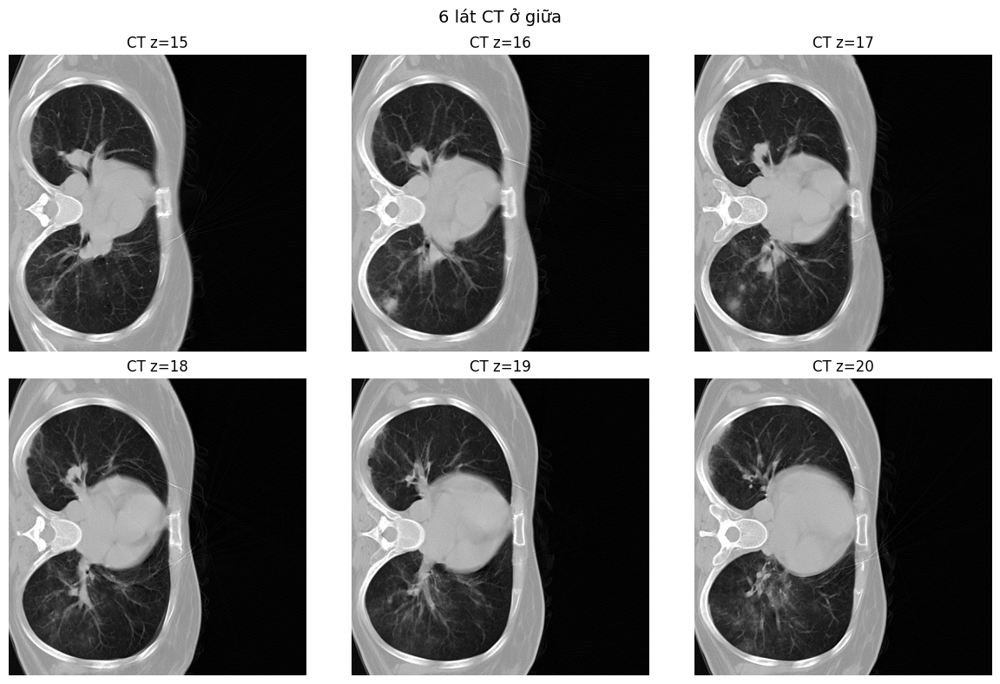

In [29]:
# ================================================
# CELL 4 — ĐỌC CT .hdr + HIỂN THỊ 6 LÁT GIỮA
# ================================================
ct_nii = nib.load(ct_hdr_path)
ct_vol = ct_nii.get_fdata().astype("float32")

H, W, Z = ct_vol.shape
print("CT shape        :", ct_vol.shape)
print("CT dtype header :", ct_nii.header.get_data_dtype())
print("Voxel spacing   :", ct_nii.header.get_zooms())
print("CT value range  :", ct_vol.min(), "->", ct_vol.max())

# 6 lát giữa
mid = Z // 2
k = 3
slice_indices = list(range(max(0, mid-k), min(Z, mid+k)))
print("Các slice giữa:", slice_indices)

vmin = np.percentile(ct_vol, 1)
vmax = np.percentile(ct_vol, 99)

plt.figure(figsize=(12, 8))
for i, z in enumerate(slice_indices):
    plt.subplot(2, 3, i+1)
    plt.imshow(ct_vol[:, :, z], cmap="gray", vmin=vmin, vmax=vmax)
    plt.title(f"CT z={z}")
    plt.axis("off")

plt.suptitle("6 lát CT ở giữa", fontsize=14)
plt.tight_layout()
plt.show()

### Hiển thị img + mask + overlay

In [ ]:
# ============================================================
# CELL — DÙNG LABEL .hdr ĐỂ TẠO MASK 3D & HIỂN THỊ 6 IMG+MASK+OVERLAY
# ============================================================
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# -------------------------------
# 0. CẤU HÌNH ĐƯỜNG DẪN
# -------------------------------
RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID19_ROOT = os.path.join(RAW_ROOT, "Organized COVID19 CT Data_rev2")
PART1_CT_DIR    = os.path.join(COVID19_ROOT, "Part 1")
PART1_LABEL_DIR = os.path.join(PART1_CT_DIR, "CT Labels")

def get_prefix(basename: str) -> str:
    return basename.split("_")[0]

# -------------------------------
# 1. CHỌN 1 CASE CÓ LABEL .hdr
# -------------------------------
# gom tất cả label .hdr theo prefix
label_map = {}
for f in os.listdir(PART1_LABEL_DIR):
    if f.lower().endswith(".hdr"):
        base = os.path.splitext(f)[0]
        prefix = get_prefix(base)   # p131_...
        label_map.setdefault(prefix, []).append(os.path.join(PART1_LABEL_DIR, f))

ct_candidates = []
for f in os.listdir(PART1_CT_DIR):
    if f.lower().endswith(".hdr"):
        base = os.path.splitext(f)[0]
        prefix = get_prefix(base)
        if prefix in label_map:
            ct_candidates.append(os.path.join(PART1_CT_DIR, f))

if not ct_candidates:
    raise RuntimeError("Không tìm thấy CT nào có label .hdr trong Part 1.")

ct_hdr_path = np.random.choice(ct_candidates)
ct_base = os.path.splitext(os.path.basename(ct_hdr_path))[0]
prefix = get_prefix(ct_base)

# chọn 1 label hdr cùng prefix (thường là pXXX_llns... hoặc pXXX_lns...)
lbl_hdr_path = sorted(label_map[prefix])[0]

print("CT HDR path   :", ct_hdr_path)
print("Label HDR path:", lbl_hdr_path)
print("Prefix        :", prefix)

# -------------------------------
# 2. ĐỌC CT & LABEL, IN THÔNG TIN
# -------------------------------
ct_nii = nib.load(ct_hdr_path)
lbl_nii = nib.load(lbl_hdr_path)

ct  = ct_nii.get_fdata().astype(np.float32)
lbl = lbl_nii.get_fdata().astype(np.float32)

print("\n=== CT HEADER (tóm tắt) ===")
ct_hdr = ct_nii.header
print("dim    :", ct_hdr['dim'])
print("pixdim :", ct_hdr['pixdim'])
print("datatype:", ct_hdr.get_data_dtype())
print("bitpix  :", ct_hdr['bitpix'])

print("\n=== LABEL HEADER (tóm tắt) ===")
lbl_hdr = lbl_nii.header
print("dim    :", lbl_hdr['dim'])
print("pixdim :", lbl_hdr['pixdim'])
print("datatype:", lbl_hdr.get_data_dtype())
print("bitpix  :", lbl_hdr['bitpix'])

print("\n=== SHAPES ===")
print("CT  shape :", ct.shape)
print("Mask shape:", lbl.shape)

print("\n=== CT VALUE RANGE (raw) ===")
print("min =", ct.min(), "max =", ct.max())

print("\n=== LABEL UNIQUE VALUES (raw) ===")
uniq_lbl = np.unique(lbl)
print("unique =", uniq_lbl)

# -------------------------------
# 3. CHUẨN HÓA MASK: -1024 / -1023 -> 0 / 1
# -------------------------------
bg_val     = uniq_lbl.min()   # -1024
lesion_val = uniq_lbl.max()   # -1023.x

mask_bin = (np.abs(lbl - lesion_val) < 1e-3).astype(np.uint8)
print("\n=== MASK BIN INFO ===")
print("unique mask_bin:", np.unique(mask_bin))
print("Tổng pixel lesion:", int(mask_bin.sum()))

# -------------------------------
# 4. HIỂN THỊ 6 LÁT GIỮA: CT + MASK + OVERLAY
# -------------------------------
H, W, Z = ct.shape
z_mid = Z // 2
z_list = [z_mid - 1, z_mid, z_mid + 1] if Z >= 3 else [z_mid]

fig, axes = plt.subplots(len(z_list), 3, figsize=(12, 4 * len(z_list)))

if len(z_list) == 1:
    axes = np.expand_dims(axes, axis=0)

vmin = np.percentile(ct, 1)
vmax = np.percentile(ct, 99)

for row, z in enumerate(z_list):
    ct_slice  = ct[:, :, z]
    mask_slice = mask_bin[:, :, z]

    # CT
    ax = axes[row, 0]
    im0 = ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(f"CT - slice {z}")
    ax.axis('off')
    fig.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

    # MASK
    ax = axes[row, 1]
    im1 = ax.imshow(mask_slice, cmap='gray', vmin=0, vmax=1)
    ax.set_title(f"Mask - slice {z}")
    ax.axis('off')
    fig.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

    # OVERLAY
    ax = axes[row, 2]
    ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.imshow(np.ma.masked_where(mask_slice == 0, mask_slice),
              cmap='jet', alpha=0.5)
    ax.set_title(f"Overlay - slice {z}")
    ax.axis('off')

plt.suptitle(f"{os.path.basename(ct_hdr_path)}  |  {os.path.basename(lbl_hdr_path)}",
             fontsize=14)
plt.tight_layout()
plt.show()

Số case COVID có CT+mask: 230
Số case NORMAL: 149
{'case_id': 'p1', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\p1_ns002i00001.hdr', 'label_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\CT Labels\\p1_lns003i00001.hdr'}
{'case_id': 'p10', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\p10_ns002i00001.hdr', 'label_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\CT Labels\\p10_llns003i00001.hdr'}
{'case_id': 'p100', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\

## 5. Kiểm tra thông tin toàn bộ data

### 5.1 Kiểm tra các CT trong part 1 và part 2 đều đủ mask không?

In [34]:
# ================================================
# CELL 0 — IMPORT & CẤU HÌNH ĐƯỜNG DẪN + HÀM TIỆN ÍCH
# ================================================
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from collections import defaultdict

RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID19_ROOT = os.path.join(RAW_ROOT, "Organized COVID19 CT Data_rev2")

PART1_DIR = os.path.join(COVID19_ROOT, "Part 1")
PART2_DIR = os.path.join(COVID19_ROOT, "Part 2")

PART1_CT_DIR    = PART1_DIR
PART1_LABEL_DIR = os.path.join(PART1_DIR, "CT Labels")

PART2_CT_DIR    = PART2_DIR
PART2_LABEL_DIR = os.path.join(PART2_DIR, "CT Labels")

print("PART1_CT_DIR   :", PART1_CT_DIR)
print("PART1_LABEL_DIR:", PART1_LABEL_DIR)
print("PART2_CT_DIR   :", PART2_CT_DIR)
print("PART2_LABEL_DIR:", PART2_LABEL_DIR)

def get_prefix(basename: str) -> str:
    """
    'p118_ns003i00001' -> 'p118'
    '10_ns002i00001'   -> '10'
    """
    return basename.split("_")[0]

def build_case_maps(ct_dir, label_dir):
    """
    Trả về:
      - ct_map   : prefix -> đường dẫn CT .hdr
      - lbl_map  : prefix -> list đường dẫn LABEL .hdr
    """
    ct_map = {}
    for f in os.listdir(ct_dir):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            ct_map[prefix] = os.path.join(ct_dir, f)

    lbl_map = defaultdict(list)
    if label_dir is not None and os.path.isdir(label_dir):
        for f in os.listdir(label_dir):
            if f.lower().endswith(".hdr"):
                base = os.path.splitext(f)[0]
                prefix = get_prefix(base)
                lbl_map[prefix].append(os.path.join(label_dir, f))

    return ct_map, lbl_map

PART1_CT_DIR   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1
PART1_LABEL_DIR: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels
PART2_CT_DIR   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2
PART2_LABEL_DIR: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2\CT Labels


In [35]:
# ================================================
# CELL 1 — KIỂM TRA CT PART 1 & PART 2 ĐỦ MASK CHƯA
# ================================================
part_infos = []

for part_name, ct_dir, lbl_dir in [
    ("Part 1", PART1_CT_DIR, PART1_LABEL_DIR),
    ("Part 2", PART2_CT_DIR, PART2_LABEL_DIR),
]:
    ct_map, lbl_map = build_case_maps(ct_dir, lbl_dir)

    ct_cases  = set(ct_map.keys())
    mask_cases = set(lbl_map.keys())

    both       = sorted(ct_cases & mask_cases)
    ct_only    = sorted(ct_cases - mask_cases)
    mask_only  = sorted(mask_cases - ct_cases)

    print(f"\n=== {part_name} ===")
    print("Tổng case CT        :", len(ct_cases))
    print("Tổng case có MASK   :", len(mask_cases))
    print("CT có cả CT+MASK    :", len(both))
    print("CT thiếu MASK       :", len(ct_only))
    print("MASK không có CT    :", len(mask_only))

    if ct_only:
        print("  → Một vài CT thiếu mask:", ct_only[:10])
    if mask_only:
        print("  → Một vài mask không CT:", mask_only[:10])

    part_infos.append({
        "part_name": part_name,
        "ct_map": ct_map,
        "lbl_map": lbl_map,
        "both": both,
    })


=== Part 1 ===
Tổng case CT        : 148
Tổng case có MASK   : 148
CT có cả CT+MASK    : 148
CT thiếu MASK       : 0
MASK không có CT    : 0

=== Part 2 ===
Tổng case CT        : 82
Tổng case có MASK   : 82
CT có cả CT+MASK    : 82
CT thiếu MASK       : 0
MASK không có CT    : 0


### 5.2 Quét toàn bộ CT+mask, thu thống kê

In [40]:
# ================================================
# CELL 2 — QUÉT CT+MASK, THU THỐNG KÊ  (ĐÃ FIX)
# ================================================
all_ct_mins = []
all_ct_maxs = []

all_mask_values = set()

num_slices_list = []        # số slice mỗi CT (theo CT)
mask_slices_list = []       # số slice có mask > 0 (theo MASK)
nomask_slices_list = []     # số slice không có mask (theo MASK)

shape_mismatch = []         # lưu những case shape CT vs mask lệch

# để vẽ histogram HU -> sample một phần voxel
hu_samples = []

for info in part_infos:
    part_name = info["part_name"]
    ct_map    = info["ct_map"]
    lbl_map   = info["lbl_map"]
    both      = info["both"]

    print(f"\n>>> Quét {part_name}: {len(both)} case có CT + MASK")

    for case_id in both:
        ct_hdr_path = ct_map[case_id]
        lbl_hdr_path = sorted(lbl_map[case_id])[0]  # lấy 1 label .hdr (nếu nhiều thì chọn cái đầu)

        ct_nii  = nib.load(ct_hdr_path)
        lbl_nii = nib.load(lbl_hdr_path)

        ct  = ct_nii.get_fdata().astype(np.float32)
        lbl = lbl_nii.get_fdata().astype(np.float32)

        Hc, Wc, Zc = ct.shape
        Hl, Wl, Zl = lbl.shape

        # 1) kiểm tra shape
        if ct.shape != lbl.shape:
            shape_mismatch.append((part_name, case_id, ct.shape, lbl.shape))
            # bỏ qua case này trong các thống kê còn lại để khỏi sai reshape
            print(f"  ⚠ Shape lệch, bỏ qua case {case_id}: CT {ct.shape} vs MASK {lbl.shape}")
            continue

        # từ đây trở xuống: CT và MASK cùng shape (H, W, Z)
        H, W, Z = ct.shape
        num_slices_list.append(Z)   # số slice theo CT

        # 2) HU range
        cmin, cmax = float(ct.min()), float(ct.max())
        all_ct_mins.append(cmin)
        all_ct_maxs.append(cmax)

        # sample HU để vẽ histogram sau này
        step = max(1, Z // 5)
        hu_samples.append(ct[:, :, ::step].ravel())

        # 3) mask values (thô)
        uniq_lbl = np.unique(lbl)
        all_mask_values.update(uniq_lbl.tolist())

        # chuẩn hóa mask về nhị phân theo min/max mỗi case
        bg_val = uniq_lbl.min()
        mask_bin = (np.abs(lbl - bg_val) > 1e-3).astype(np.uint8)

        # 4) tính số slice có mask / không mask (dùng shape của mask)
        Hm, Wm, Zm = mask_bin.shape
        has_mask_per_slice = mask_bin.reshape(Hm * Wm, Zm).any(axis=0)
        num_mask_slices = int(has_mask_per_slice.sum())
        num_nomask_slices = int((~has_mask_per_slice).sum())

        mask_slices_list.append(num_mask_slices)
        nomask_slices_list.append(num_nomask_slices)

print("\n=== THỐNG KÊ CHUNG SAU KHI QUÉT XONG ===")
print("Tổng số CT có mask (và shape khớp):", len(num_slices_list))
print("CT HU min (toàn bộ):", min(all_ct_mins), "→ max:", max(all_ct_maxs))

mask_vals_sorted = sorted(all_mask_values)
print("Các giá trị mask (thô) khác nhau (tối đa 20):", mask_vals_sorted[:20])
if len(mask_vals_sorted) > 20:
    print("... (cắt bớt)")


>>> Quét Part 1: 148 case có CT + MASK
  ⚠ Shape lệch, bỏ qua case p134: CT (512, 512, 47) vs MASK (512, 512, 43)
  ⚠ Shape lệch, bỏ qua case p150: CT (512, 512, 42) vs MASK (512, 512, 43)
  ⚠ Shape lệch, bỏ qua case p44: CT (512, 512, 40) vs MASK (512, 512, 35)

>>> Quét Part 2: 82 case có CT + MASK

=== THỐNG KÊ CHUNG SAU KHI QUÉT XONG ===
Tổng số CT có mask (và shape khớp): 227
CT HU min (toàn bộ): -3024.0 → max: 3071.0
Các giá trị mask (thô) khác nhau (tối đa 20): [-1024.0, -1023.0]


### 5.3 Kiểm tra giá trị pixel CT & Mask

In [43]:
# ================================================
# CELL 3 — KIỂM TRA GIÁ TRỊ PIXEL CT & MASK
# ================================================
print("=== CT VALUE RANGE (HU) TOÀN BỘ DATA ===")
print("Global CT min:", min(all_ct_mins))
print("Global CT max:", max(all_ct_maxs))

print("\n=== MASK UNIQUE VALUES TOÀN BỘ DATA ===")
mask_vals_sorted = sorted(all_mask_values)
print("Tổng số giá trị khác nhau trong mask:", len(mask_vals_sorted))

if len(mask_vals_sorted) <= 10:
    print("Danh sách đầy đủ:", mask_vals_sorted)
else:
    print("5 giá trị nhỏ nhất:", mask_vals_sorted[:5])
    print("5 giá trị lớn nhất:", mask_vals_sorted[-5:])

=== CT VALUE RANGE (HU) TOÀN BỘ DATA ===
Global CT min: -3024.0
Global CT max: 3071.0

=== MASK UNIQUE VALUES TOÀN BỘ DATA ===
Tổng số giá trị khác nhau trong mask: 2
Danh sách đầy đủ: [-1024.0, -1023.0]


### 5.4 Kiểm tra CT & mask có cùng số slice hay không

In [44]:
# ================================================
# CELL 4 — KIỂM TRA SHAPE CT VS MASK
# ================================================
if not shape_mismatch:
    print("✅ Tất cả case CT + MASK có shape trùng nhau (H, W, Z).")
else:
    print("⚠ Có case CT vs MASK lệch shape:")
    for part_name, case_id, ct_shape, lbl_shape in shape_mismatch:
        print(f"  - {part_name} | case {case_id}: CT {ct_shape}, MASK {lbl_shape}")

⚠ Có case CT vs MASK lệch shape:
  - Part 1 | case p134: CT (512, 512, 47), MASK (512, 512, 43)
  - Part 1 | case p150: CT (512, 512, 42), MASK (512, 512, 43)
  - Part 1 | case p44: CT (512, 512, 40), MASK (512, 512, 35)


### 5.5 Biểu đồ HU range

Số voxel sample để vẽ histogram: 345505792


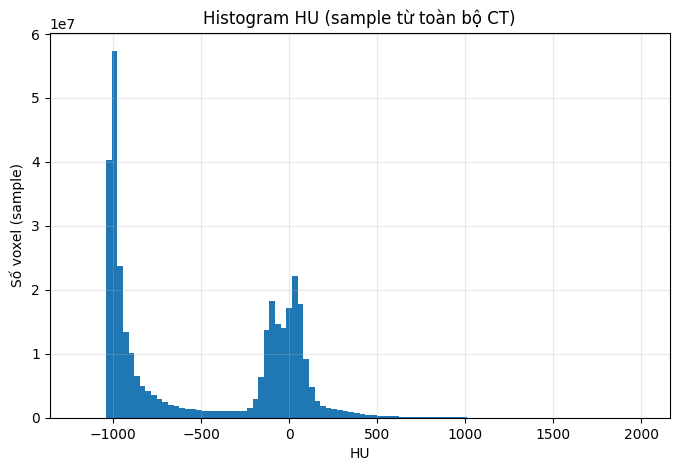

In [45]:
# ================================================
# CELL 5 — BIỂU ĐỒ THỐNG KÊ HU RANGE
# ================================================
if not hu_samples:
    print("Không có sample HU nào (hu_samples trống).")
else:
    # nối tất cả mẫu lại
    hu_all = np.concatenate(hu_samples)
    print("Số voxel sample để vẽ histogram:", hu_all.size)

    plt.figure(figsize=(8, 5))
    plt.hist(hu_all, bins=100, range=(-1200, 2000))
    plt.title("Histogram HU (sample từ toàn bộ CT)")
    plt.xlabel("HU")
    plt.ylabel("Số voxel (sample)")
    plt.grid(True, alpha=0.3)
    plt.show()

### 5.6 Biểu đồ số slice mỗi CT

Tổng CT: 227
Số slice min: 28 max: 66 mean: 41.86784140969163


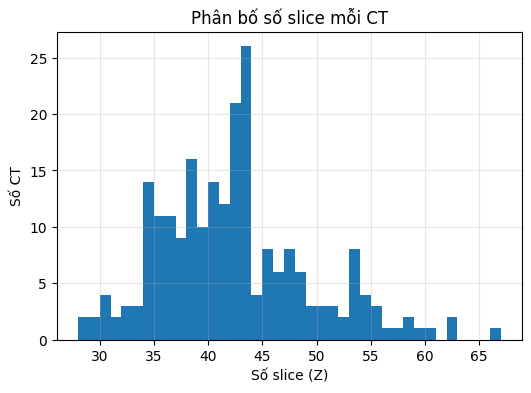

In [46]:
# ================================================
# CELL 6 — BIỂU ĐỒ THỐNG KÊ SỐ SLICE MỖI CT
# ================================================
num_slices_arr = np.array(num_slices_list)

print("Tổng CT:", num_slices_arr.size)
print("Số slice min:", num_slices_arr.min(),
      "max:", num_slices_arr.max(),
      "mean:", float(num_slices_arr.mean()))

plt.figure(figsize=(6, 4))
plt.hist(num_slices_arr, bins=range(int(num_slices_arr.min()),
                                    int(num_slices_arr.max()) + 2))
plt.title("Phân bố số slice mỗi CT")
plt.xlabel("Số slice (Z)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

### 5.7 Kiểm tra tỷ lệ slice không có mask

Tổng số CT có mask: 227
Tổng số slice     : 9504
Tổng slice có mask: 4633
Tổng slice không mask: 4871
Tỷ lệ slice không mask toàn bộ dataset: 51.25%


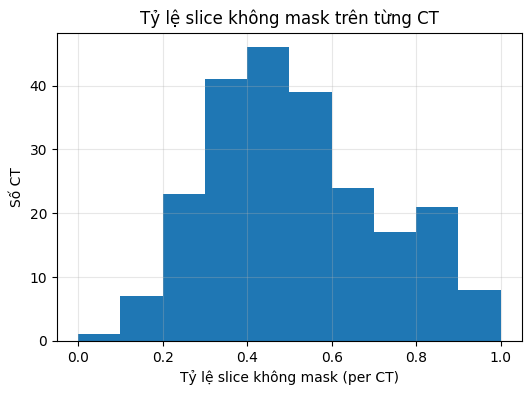

In [47]:
# ================================================
# CELL 7 — TỶ LỆ SLICE KHÔNG CÓ MASK
# ================================================
mask_slices_arr   = np.array(mask_slices_list)
nomask_slices_arr = np.array(nomask_slices_list)
total_slices_arr  = mask_slices_arr + nomask_slices_arr

global_nomask = int(nomask_slices_arr.sum())
global_total  = int(total_slices_arr.sum())
ratio_nomask  = global_nomask / global_total if global_total > 0 else 0.0

print("Tổng số CT có mask:", total_slices_arr.size)
print("Tổng số slice     :", global_total)
print("Tổng slice có mask:", int(mask_slices_arr.sum()))
print("Tổng slice không mask:", global_nomask)
print(f"Tỷ lệ slice không mask toàn bộ dataset: {ratio_nomask*100:.2f}%")

plt.figure(figsize=(6,4))
plt.hist(nomask_slices_arr / total_slices_arr, bins=10, range=(0,1))
plt.title("Tỷ lệ slice không mask trên từng CT")
plt.xlabel("Tỷ lệ slice không mask (per CT)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

## 6. Trực quan hóa dữ liệu

### 6.1 Import, cấu hình đường dẫn, hàm tiện ích

In [1]:
# ================================================
# CELL 0 — IMPORT & CẤU HÌNH ĐƯỜNG DẪN + HÀM TIỆN ÍCH
# ================================================
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from collections import defaultdict

RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID19_ROOT = os.path.join(RAW_ROOT, "Organized COVID19 CT Data_rev2")

PART1_DIR = os.path.join(COVID19_ROOT, "Part 1")
PART2_DIR = os.path.join(COVID19_ROOT, "Part 2")

PART1_CT_DIR    = PART1_DIR
PART1_LABEL_DIR = os.path.join(PART1_DIR, "CT Labels")

PART2_CT_DIR    = PART2_DIR
PART2_LABEL_DIR = os.path.join(PART2_DIR, "CT Labels")

print("PART1_CT_DIR   :", PART1_CT_DIR)
print("PART1_LABEL_DIR:", PART1_LABEL_DIR)
print("PART2_CT_DIR   :", PART2_CT_DIR)
print("PART2_LABEL_DIR:", PART2_LABEL_DIR)

def get_prefix(basename: str) -> str:
    """
    'p118_ns003i00001' -> 'p118'
    '10_ns002i00001'   -> '10'
    """
    return basename.split("_")[0]

def build_case_maps(ct_dir, label_dir):
    """
    Trả về:
      - ct_map  : prefix -> đường dẫn CT .hdr
      - lbl_map : prefix -> list đường dẫn LABEL .hdr
    """
    ct_map = {}
    for f in os.listdir(ct_dir):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            ct_map[prefix] = os.path.join(ct_dir, f)

    lbl_map = defaultdict(list)
    if label_dir is not None and os.path.isdir(label_dir):
        for f in os.listdir(label_dir):
            if f.lower().endswith(".hdr"):
                base = os.path.splitext(f)[0]
                prefix = get_prefix(base)
                lbl_map[prefix].append(os.path.join(label_dir, f))

    return ct_map, lbl_map

PART1_CT_DIR   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1
PART1_LABEL_DIR: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\CT Labels
PART2_CT_DIR   : D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2
PART2_LABEL_DIR: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 2\CT Labels


### 6.1 Kiểm tra CT trong Part 1 & Part 2 có đủ mask không

In [2]:
# ================================================
# CELL 1 — KIỂM TRA CT PART 1 & PART 2 ĐỦ MASK CHƯA
# ================================================
part_infos = []

for part_name, ct_dir, lbl_dir in [
    ("Part 1", PART1_CT_DIR, PART1_LABEL_DIR),
    ("Part 2", PART2_CT_DIR, PART2_LABEL_DIR),
]:
    ct_map, lbl_map = build_case_maps(ct_dir, lbl_dir)

    ct_cases   = set(ct_map.keys())
    mask_cases = set(lbl_map.keys())

    both      = sorted(ct_cases & mask_cases)
    ct_only   = sorted(ct_cases - mask_cases)
    mask_only = sorted(mask_cases - ct_cases)

    print(f"\n=== {part_name} ===")
    print("Tổng case CT        :", len(ct_cases))
    print("Tổng case có MASK   :", len(mask_cases))
    print("CT có cả CT+MASK    :", len(both))
    print("CT thiếu MASK       :", len(ct_only))
    print("MASK không có CT    :", len(mask_only))

    if ct_only:
        print("  → Một vài CT thiếu mask:", ct_only[:10])
    if mask_only:
        print("  → Một vài mask không CT:", mask_only[:10])

    part_infos.append({
        "part_name": part_name,
        "ct_map": ct_map,
        "lbl_map": lbl_map,
        "both": both,
    })


=== Part 1 ===
Tổng case CT        : 148
Tổng case có MASK   : 148
CT có cả CT+MASK    : 148
CT thiếu MASK       : 0
MASK không có CT    : 0

=== Part 2 ===
Tổng case CT        : 82
Tổng case có MASK   : 82
CT có cả CT+MASK    : 82
CT thiếu MASK       : 0
MASK không có CT    : 0


### 6.2 Quét CT+mask, thu thống kê (đã fix reshape)

In [3]:
# ================================================
# CELL 2 — QUÉT CT+MASK, THU THỐNG KÊ  (ĐÃ FIX)
# ================================================
all_ct_mins = []
all_ct_maxs = []

all_mask_values = set()

num_slices_list = []        # số slice mỗi CT (theo CT)
mask_slices_list = []       # số slice có mask > 0 (theo MASK)
nomask_slices_list = []     # số slice không có mask (theo MASK)

shape_mismatch = []         # lưu những case shape CT vs mask lệch

# để vẽ histogram HU -> sample một phần voxel
hu_samples = []

for info in part_infos:
    part_name = info["part_name"]
    ct_map    = info["ct_map"]
    lbl_map   = info["lbl_map"]
    both      = info["both"]

    print(f"\n>>> Quét {part_name}: {len(both)} case có CT + MASK")

    for case_id in both:
        ct_hdr_path  = ct_map[case_id]
        lbl_hdr_path = sorted(lbl_map[case_id])[0]  # nếu có nhiều label thì lấy cái đầu

        ct_nii  = nib.load(ct_hdr_path)
        lbl_nii = nib.load(lbl_hdr_path)

        ct  = ct_nii.get_fdata().astype(np.float32)
        lbl = lbl_nii.get_fdata().astype(np.float32)

        Hc, Wc, Zc = ct.shape
        Hl, Wl, Zl = lbl.shape

        # 1) kiểm tra shape
        if ct.shape != lbl.shape:
            shape_mismatch.append((part_name, case_id, ct.shape, lbl.shape))
            print(f"  ⚠ Shape lệch, bỏ qua case {case_id}: CT {ct.shape} vs MASK {lbl.shape}")
            continue

        # từ đây trở xuống: CT và MASK cùng shape
        H, W, Z = ct.shape
        num_slices_list.append(Z)

        # 2) HU range
        cmin, cmax = float(ct.min()), float(ct.max())
        all_ct_mins.append(cmin)
        all_ct_maxs.append(cmax)

        # sample HU để vẽ histogram
        step = max(1, Z // 5)
        hu_samples.append(ct[:, :, ::step].ravel())

        # 3) mask values (thô)
        uniq_lbl = np.unique(lbl)
        all_mask_values.update(uniq_lbl.tolist())

        # chuẩn hóa mask về nhị phân theo min/max mỗi case
        bg_val = uniq_lbl.min()
        mask_bin = (np.abs(lbl - bg_val) > 1e-3).astype(np.uint8)

        # 4) số slice có mask / không mask (dùng shape của mask)
        Hm, Wm, Zm = mask_bin.shape
        has_mask_per_slice = mask_bin.reshape(Hm * Wm, Zm).any(axis=0)
        num_mask_slices    = int(has_mask_per_slice.sum())
        num_nomask_slices  = int((~has_mask_per_slice).sum())

        mask_slices_list.append(num_mask_slices)
        nomask_slices_list.append(num_nomask_slices)

print("\n=== THỐNG KÊ CHUNG SAU KHI QUÉT XONG ===")
print("Tổng số CT có mask (và shape khớp):", len(num_slices_list))
print("CT HU min (toàn bộ):", min(all_ct_mins), "→ max:", max(all_ct_maxs))

mask_vals_sorted = sorted(all_mask_values)
print("Các giá trị mask (thô) khác nhau (tối đa 20):", mask_vals_sorted[:20])
if len(mask_vals_sorted) > 20:
    print("... (cắt bớt)")


>>> Quét Part 1: 148 case có CT + MASK
  ⚠ Shape lệch, bỏ qua case p134: CT (512, 512, 47) vs MASK (512, 512, 43)
  ⚠ Shape lệch, bỏ qua case p150: CT (512, 512, 42) vs MASK (512, 512, 43)
  ⚠ Shape lệch, bỏ qua case p44: CT (512, 512, 40) vs MASK (512, 512, 35)

>>> Quét Part 2: 82 case có CT + MASK

=== THỐNG KÊ CHUNG SAU KHI QUÉT XONG ===
Tổng số CT có mask (và shape khớp): 227
CT HU min (toàn bộ): -3024.0 → max: 3071.0
Các giá trị mask (thô) khác nhau (tối đa 20): [-1024.0, -1023.0]


### 6.3 Kiểm tra giá trị pixel CT & mask

In [4]:
# ================================================
# CELL 3 — KIỂM TRA GIÁ TRỊ PIXEL CT & MASK
# ================================================
print("=== CT VALUE RANGE (HU) TOÀN BỘ DATA ===")
print("Global CT min:", min(all_ct_mins))
print("Global CT max:", max(all_ct_maxs))

print("\n=== MASK UNIQUE VALUES TOÀN BỘ DATA ===")
mask_vals_sorted = sorted(all_mask_values)
print("Tổng số giá trị khác nhau trong mask:", len(mask_vals_sorted))

if len(mask_vals_sorted) <= 10:
    print("Danh sách đầy đủ:", mask_vals_sorted)
else:
    print("5 giá trị nhỏ nhất:", mask_vals_sorted[:5])
    print("5 giá trị lớn nhất:", mask_vals_sorted[-5:])

=== CT VALUE RANGE (HU) TOÀN BỘ DATA ===
Global CT min: -3024.0
Global CT max: 3071.0

=== MASK UNIQUE VALUES TOÀN BỘ DATA ===
Tổng số giá trị khác nhau trong mask: 2
Danh sách đầy đủ: [-1024.0, -1023.0]


### 6.4 Kiểm tra CT & mask có cùng slice không

In [5]:
# ================================================
# CELL 4 — KIỂM TRA SHAPE CT VS MASK
# ================================================
if not shape_mismatch:
    print("✅ Tất cả case CT + MASK có shape trùng nhau (H, W, Z).")
else:
    print("⚠ Có case CT vs MASK lệch shape:")
    for part_name, case_id, ct_shape, lbl_shape in shape_mismatch:
        print(f"  - {part_name} | case {case_id}: CT {ct_shape}, MASK {lbl_shape}")

⚠ Có case CT vs MASK lệch shape:
  - Part 1 | case p134: CT (512, 512, 47), MASK (512, 512, 43)
  - Part 1 | case p150: CT (512, 512, 42), MASK (512, 512, 43)
  - Part 1 | case p44: CT (512, 512, 40), MASK (512, 512, 35)


### 6.5 Biểu đồ HU range (histogram)

Số voxel sample để vẽ histogram: 345505792


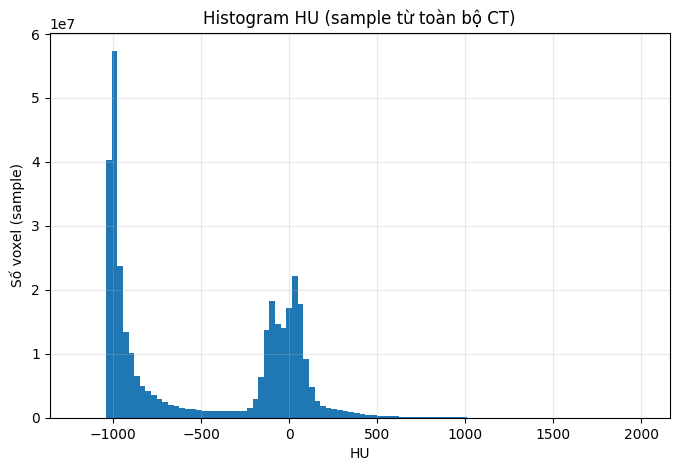

In [6]:
# ================================================
# CELL 5 — BIỂU ĐỒ THỐNG KÊ HU RANGE
# ================================================
if not hu_samples:
    print("Không có sample HU nào (hu_samples trống).")
else:
    hu_all = np.concatenate(hu_samples)
    print("Số voxel sample để vẽ histogram:", hu_all.size)

    plt.figure(figsize=(8, 5))
    plt.hist(hu_all, bins=100, range=(-1200, 2000))
    plt.title("Histogram HU (sample từ toàn bộ CT)")
    plt.xlabel("HU")
    plt.ylabel("Số voxel (sample)")
    plt.grid(True, alpha=0.3)
    plt.show()

### 6.6 Biểu đồ số slice mỗi CT

Tổng CT: 227
Số slice min: 28 max: 66 mean: 41.86784140969163


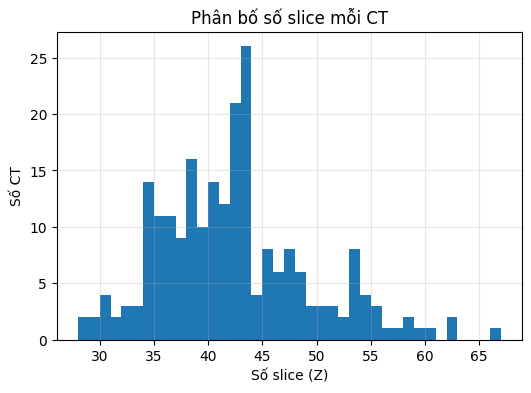

In [7]:
# ================================================
# CELL 6 — BIỂU ĐỒ THỐNG KÊ SỐ SLICE MỖI CT
# ================================================
num_slices_arr = np.array(num_slices_list)

print("Tổng CT:", num_slices_arr.size)
print("Số slice min:", num_slices_arr.min(),
      "max:", num_slices_arr.max(),
      "mean:", float(num_slices_arr.mean()))

plt.figure(figsize=(6, 4))
plt.hist(num_slices_arr,
         bins=range(int(num_slices_arr.min()),
                    int(num_slices_arr.max()) + 2))
plt.title("Phân bố số slice mỗi CT")
plt.xlabel("Số slice (Z)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

### 6.7 Tỷ lệ slice không có mask

Tổng số CT có mask: 227
Tổng số slice     : 9504
Tổng slice có mask: 4633
Tổng slice không mask: 4871
Tỷ lệ slice không mask toàn bộ dataset: 51.25%


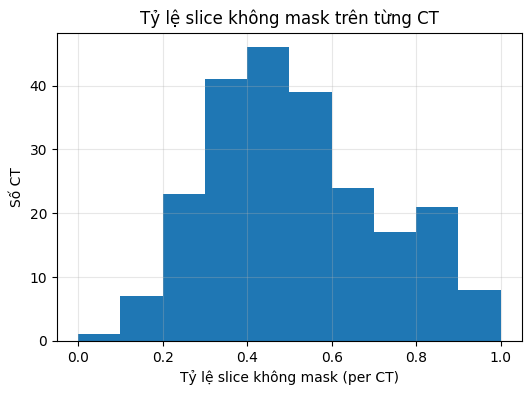

In [8]:
# ================================================
# CELL 7 — TỶ LỆ SLICE KHÔNG CÓ MASK
# ================================================
mask_slices_arr   = np.array(mask_slices_list)
nomask_slices_arr = np.array(nomask_slices_list)
total_slices_arr  = mask_slices_arr + nomask_slices_arr

global_nomask = int(nomask_slices_arr.sum())
global_total  = int(total_slices_arr.sum())
ratio_nomask  = global_nomask / global_total if global_total > 0 else 0.0

print("Tổng số CT có mask:", total_slices_arr.size)
print("Tổng số slice     :", global_total)
print("Tổng slice có mask:", int(mask_slices_arr.sum()))
print("Tổng slice không mask:", global_nomask)
print(f"Tỷ lệ slice không mask toàn bộ dataset: {ratio_nomask*100:.2f}%")

plt.figure(figsize=(6,4))
plt.hist(nomask_slices_arr / total_slices_arr, bins=10, range=(0,1))
plt.title("Tỷ lệ slice không mask trên từng CT")
plt.xlabel("Tỷ lệ slice không mask (per CT)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

### 6.8 Thống kê spacing (pixdim) giữa các CT

Số CT (đã tính spacing): 230
sx (mm): min = 0.5 max = 0.97265625 mean = 0.7000425
sy (mm): min = 0.5 max = 0.97265625 mean = 0.7000425
sz (mm): min = 5.0 max = 8.200012 mean = 6.94087


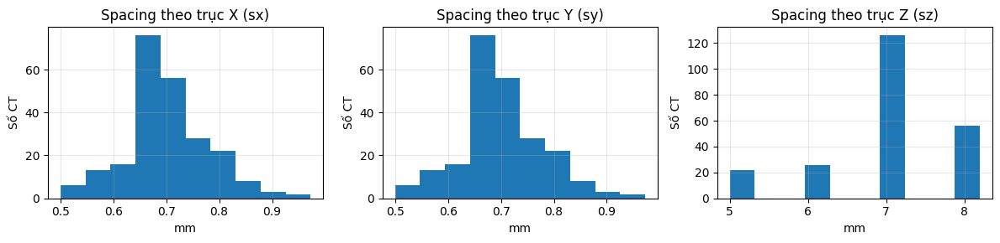

In [9]:
# ================================================
# CELL 8 — THỐNG KÊ SPACING (PIXDIM) CỦA CÁC CT
# ================================================
spacings = []   # (sx, sy, sz)

for info in part_infos:
    part_name = info["part_name"]
    ct_map    = info["ct_map"]
    both      = info["both"]

    for case_id in both:
        ct_hdr_path = ct_map[case_id]
        ct_nii = nib.load(ct_hdr_path)
        zooms = ct_nii.header.get_zooms()  # (sx, sy, sz) với dạng (x, y, z)

        # chỉ lấy 3 giá trị đầu
        spacings.append(zooms[:3])

spacings = np.array(spacings)
sx, sy, sz = spacings[:,0], spacings[:,1], spacings[:,2]

print("Số CT (đã tính spacing):", spacings.shape[0])
print("sx (mm): min =", sx.min(), "max =", sx.max(), "mean =", sx.mean())
print("sy (mm): min =", sy.min(), "max =", sy.max(), "mean =", sy.mean())
print("sz (mm): min =", sz.min(), "max =", sz.max(), "mean =", sz.mean())

plt.figure(figsize=(12,3))
plt.subplot(1,3,1)
plt.hist(sx, bins=10)
plt.title("Spacing theo trục X (sx)")
plt.xlabel("mm"); plt.ylabel("Số CT"); plt.grid(True, alpha=0.3)

plt.subplot(1,3,2)
plt.hist(sy, bins=10)
plt.title("Spacing theo trục Y (sy)")
plt.xlabel("mm"); plt.ylabel("Số CT"); plt.grid(True, alpha=0.3)

plt.subplot(1,3,3)
plt.hist(sz, bins=10)
plt.title("Spacing theo trục Z (sz)")
plt.xlabel("mm"); plt.ylabel("Số CT"); plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 6.9 Tỷ lệ pixel mask (lesion) trong mỗi CT

Số CT dùng để tính ratio: 227
Tỷ lệ pixel lesion min : 8.597740760216347e-05
Tỷ lệ pixel lesion max : 0.08676890837840545
Tỷ lệ pixel lesion mean: 0.015414169073308615


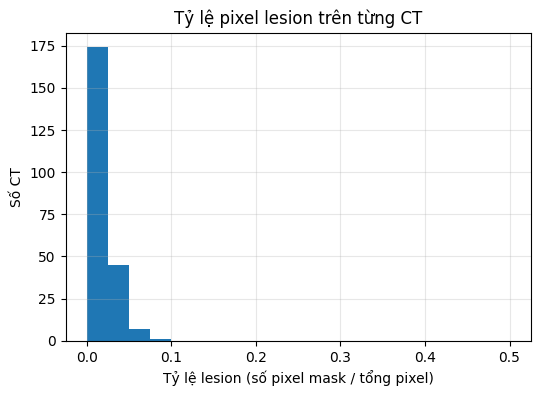

In [10]:
# ================================================
# CELL 9 — TỶ LỆ PIXEL MASK (LESION) TRÊN TỪNG CT
# ================================================
mask_pixel_ratios = []   # list ratio per CT

for info in part_infos:
    part_name = info["part_name"]
    ct_map    = info["ct_map"]
    lbl_map   = info["lbl_map"]
    both      = info["both"]

    for case_id in both:
        ct_hdr_path  = ct_map[case_id]
        lbl_hdr_path = sorted(lbl_map[case_id])[0]

        ct_nii  = nib.load(ct_hdr_path)
        lbl_nii = nib.load(lbl_hdr_path)

        ct  = ct_nii.get_fdata().astype(np.float32)
        lbl = lbl_nii.get_fdata().astype(np.float32)

        if ct.shape != lbl.shape:
            # bỏ qua case shape lệch (đã liệt kê ở cell 4)
            continue

        H, W, Z = ct.shape
        uniq_lbl = np.unique(lbl)
        bg_val   = uniq_lbl.min()
        mask_bin = (np.abs(lbl - bg_val) > 1e-3).astype(np.uint8)

        lesion_pixels = int(mask_bin.sum())
        total_pixels  = H * W * Z
        ratio = lesion_pixels / total_pixels
        mask_pixel_ratios.append(ratio)

mask_pixel_ratios = np.array(mask_pixel_ratios)

print("Số CT dùng để tính ratio:", mask_pixel_ratios.size)
print("Tỷ lệ pixel lesion min :", mask_pixel_ratios.min())
print("Tỷ lệ pixel lesion max :", mask_pixel_ratios.max())
print("Tỷ lệ pixel lesion mean:", mask_pixel_ratios.mean())

plt.figure(figsize=(6,4))
plt.hist(mask_pixel_ratios, bins=20, range=(0, 0.5))
plt.title("Tỷ lệ pixel lesion trên từng CT")
plt.xlabel("Tỷ lệ lesion (số pixel mask / tổng pixel)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

### 6.10 Thống kê tỷ lệ pixel mask và non-mask toàn dataset

=== TỔNG THỐNG KÊ PIXEL TOÀN DATASET ===
Tổng số pixel CT      : 2523136000
Tổng pixel mask       : 38908243
Tổng pixel không mask : 2484227757
Tỷ lệ pixel MASK      : 1.5421%
Tỷ lệ pixel NON-MASK  : 98.4579%


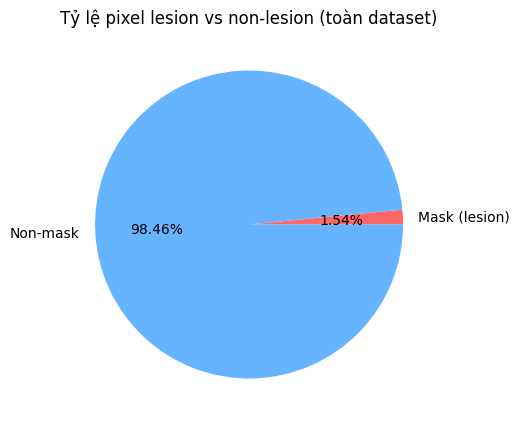

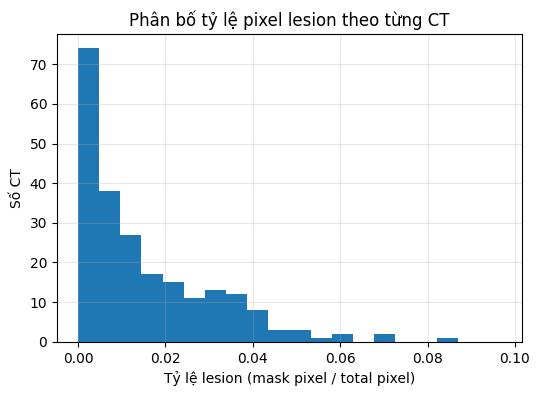

In [11]:
# ================================================
# CELL 10 — THỐNG KÊ TỶ LỆ PIXEL MASK & NON-MASK
# ================================================

total_mask_pixels = 0
total_pixels      = 0

for info in part_infos:
    part_name = info["part_name"]
    ct_map    = info["ct_map"]
    lbl_map   = info["lbl_map"]
    both      = info["both"]

    for case_id in both:
        lbl_hdr_path = sorted(lbl_map[case_id])[0]
        lbl_nii = nib.load(lbl_hdr_path)
        lbl = lbl_nii.get_fdata().astype(np.float32)

        H, W, Z = lbl.shape

        uniq_lbl = np.unique(lbl)
        bg_val = uniq_lbl.min()

        # Chuyển thành mask nhị phân
        mask_bin = (np.abs(lbl - bg_val) > 1e-3).astype(np.uint8)

        total_mask_pixels += int(mask_bin.sum())
        total_pixels      += H * W * Z

# Tính non-mask
total_nonmask_pixels = total_pixels - total_mask_pixels

ratio_mask    = total_mask_pixels / total_pixels
ratio_nonmask = total_nonmask_pixels / total_pixels

print("=== TỔNG THỐNG KÊ PIXEL TOÀN DATASET ===")
print("Tổng số pixel CT      :", total_pixels)
print("Tổng pixel mask       :", total_mask_pixels)
print("Tổng pixel không mask :", total_nonmask_pixels)
print(f"Tỷ lệ pixel MASK      : {ratio_mask*100:.4f}%")
print(f"Tỷ lệ pixel NON-MASK  : {ratio_nonmask*100:.4f}%")

# -----------------------------
# BIỂU ĐỒ PIE CHART
# -----------------------------
plt.figure(figsize=(5,5))
plt.pie(
    [total_mask_pixels, total_nonmask_pixels],
    labels=["Mask (lesion)", "Non-mask"],
    autopct="%1.2f%%",
    colors=["#ff6666", "#66b3ff"]
)
plt.title("Tỷ lệ pixel lesion vs non-lesion (toàn dataset)")
plt.show()

# -----------------------------
# HISTOGRAM TỶ LỆ MASK THEO CT
# (dùng mask_pixel_ratios từ cell 9)
# -----------------------------
plt.figure(figsize=(6,4))
plt.hist(mask_pixel_ratios, bins=20, range=(0, max(mask_pixel_ratios)+0.01))
plt.title("Phân bố tỷ lệ pixel lesion theo từng CT")
plt.xlabel("Tỷ lệ lesion (mask pixel / total pixel)")
plt.ylabel("Số CT")
plt.grid(True, alpha=0.3)
plt.show()

## 7. Tách background và lung

### 7.1 Chọn ngẫu nhiên 1 CT + load CT & label

In [6]:
# ============================================================
# CELL 1 — CẤU HÌNH ĐƯỜNG DẪN + HÀM LIỆT KÊ CT
# ============================================================
import os
import re
import random
import numpy as np
import nibabel as nib

# Gốc dữ liệu
RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID19_ROOT = os.path.join(RAW_ROOT, "COVID-19 & Normal CT Segmentation Dataset", "Organized COVID19 CT Data_rev2")

PART1_CT_DIR    = os.path.join(COVID19_ROOT, "Part 1")
PART1_LABEL_DIR = os.path.join(PART1_CT_DIR, "CT Labels")

PART2_CT_DIR    = os.path.join(COVID19_ROOT, "Part 2")
PART2_LABEL_DIR = os.path.join(PART2_CT_DIR, "CT Labels")

NORMAL_CT_DIR   = os.path.join(RAW_ROOT, "COVID-19 & Normal CT Segmentation Dataset", "Organized Normal CT Data")


def get_prefix(name: str) -> str:
    """
    Lấy prefix bệnh nhân trước '_ns' hoặc '_lns'.
    Ví dụ:
        'p1_ns003i00001'   -> 'p1'
        'p1_lns003i00001'  -> 'p1'
        '1_ns002i00001'    -> '1'
    """
    m = re.match(r"(.+?)_l?ns", name)
    if m:
        return m.group(1)
    # fallback trong trường hợp đặc biệt
    return name.split("_")[0]


def list_covid_cases():
    """
    Liệt kê các case COVID (có CT + label), từ Part 1 và Part 2.
    Trả về: list dict {'case_id','part','ct_path','label_path'}
    """
    cases = []

    # -------- Part 1 --------
    ct_map = {}
    for f in os.listdir(PART1_CT_DIR):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            ct_map[prefix] = os.path.join(PART1_CT_DIR, f)

    label_map = {}
    for f in os.listdir(PART1_LABEL_DIR):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            label_map[prefix] = os.path.join(PART1_LABEL_DIR, f)

    for prefix in sorted(ct_map.keys()):
        if prefix in label_map:
            cases.append({
                "case_id": prefix,
                "part": "Part1",
                "ct_path": ct_map[prefix],
                "label_path": label_map[prefix]
            })

    # -------- Part 2 --------
    ct_map = {}
    for f in os.listdir(PART2_CT_DIR):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            ct_map[prefix] = os.path.join(PART2_CT_DIR, f)

    label_map = {}
    for f in os.listdir(PART2_LABEL_DIR):
        if f.lower().endswith(".hdr"):
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)
            label_map[prefix] = os.path.join(PART2_LABEL_DIR, f)

    for prefix in sorted(ct_map.keys()):
        if prefix in label_map:
            cases.append({
                "case_id": prefix,
                "part": "Part2",
                "ct_path": ct_map[prefix],
                "label_path": label_map[prefix]
            })

    return cases


def list_normal_cases():
    """Liệt kê các CT NORMAL (.hdr)"""
    cases = []
    for f in os.listdir(NORMAL_CT_DIR):
        if f.lower().endswith(".hdr"):
            ct_path = os.path.join(NORMAL_CT_DIR, f)
            base = os.path.splitext(f)[0]
            prefix = get_prefix(base)   # ví dụ: '100', '102',...
            cases.append({
                "case_id": prefix,
                "ct_path": ct_path
            })
    return cases


# Test nhanh
covid_cases  = list_covid_cases()
normal_cases = list_normal_cases()
print("Số case COVID có CT+mask:", len(covid_cases))
print("Số case NORMAL:", len(normal_cases))

# In thử 3 case đầu để debug
for c in covid_cases[:3]:
    print(c)

Số case COVID có CT+mask: 230
Số case NORMAL: 149
{'case_id': 'p1', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\p1_ns002i00001.hdr', 'label_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\CT Labels\\p1_lns003i00001.hdr'}
{'case_id': 'p10', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\p10_ns002i00001.hdr', 'label_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\CT Labels\\p10_llns003i00001.hdr'}
{'case_id': 'p100', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\

### 7.2 Hàm segment phổi (placeholder) + tạo ROI

In [7]:
# ============================================================
# CELL 2 — HÀM SEGMENT PHỔI (PLACEHOLDER) VÀ TẠO ROI
# ============================================================
import cv2
from scipy import ndimage as ndi

def segment_lung_3d(ct, hu_min=-1000, hu_max=-400, min_area=1000):
    """
    Segment phổi 3D (PLACEHOLDER).
    - Hiện tại dùng threshold + morphology 2D theo từng slice.
    - SAU NÀY: bạn thay nội dung hàm này bằng pretrained lung segmentation (Option A).
    """
    H, W, Z = ct.shape
    lung_mask = np.zeros((H, W, Z), dtype=np.uint8)

    for z in range(Z):
        sl = ct[:, :, z]

        # 1) Threshold theo HU
        bin_img = ((sl >= hu_min) & (sl <= hu_max)).astype(np.uint8) * 255

        # 2) Morphology: mở + đóng để loại noise
        kernel = np.ones((5, 5), np.uint8)
        bin_img = cv2.morphologyEx(bin_img, cv2.MORPH_OPEN, kernel, iterations=1)
        bin_img = cv2.morphologyEx(bin_img, cv2.MORPH_CLOSE, kernel, iterations=1)

        # 3) Lấy các thành phần liên thông, giữ 2 vùng lớn nhất
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(bin_img, connectivity=8)
        areas = stats[1:, cv2.CC_STAT_AREA]
        if len(areas) == 0:
            continue
        sorted_idx = np.argsort(areas)[::-1]  # từ lớn đến nhỏ
        keep_labels = [sorted_idx[0] + 1]
        if len(areas) > 1 and areas[sorted_idx[1]] > min_area:
            keep_labels.append(sorted_idx[1] + 1)

        lung_slice = np.isin(labels, keep_labels).astype(np.uint8)

        # 4) Fill holes
        lung_slice = ndi.binary_fill_holes(lung_slice).astype(np.uint8)

        lung_mask[:, :, z] = lung_slice

    return lung_mask

def make_lesion_mask(lbl):
    """Từ volume label thô -> mask tổn thương nhị phân (0/1)."""
    bg_val = lbl.min()
    lesion_mask = (np.abs(lbl - bg_val) > 1e-3).astype(np.uint8)
    return lesion_mask

def make_roi_covid(ct, lung_mask, lesion_mask_bin, dilate_iter=2):
    """
    ROI cho CT COVID:
    - ROI = lung_mask ∪ lesion_mask, sau đó dilate thêm cho an toàn.
    """
    roi_mask = (lung_mask.astype(bool) | lesion_mask_bin.astype(bool))
    print("ROI trước dilate:", roi_mask.sum())

    struct = ndi.generate_binary_structure(3, 1)
    roi_mask = ndi.binary_dilation(roi_mask, structure=struct, iterations=dilate_iter)
    roi_mask = roi_mask.astype(np.uint8)

    print("ROI sau dilate  :", roi_mask.sum())

    ct_roi = np.where(roi_mask, ct, -1024.0)
    return roi_mask, ct_roi

def make_roi_normal(ct, lung_mask, dilate_iter=1):
    """
    ROI cho CT NORMAL:
    - ROI = lung_mask (có thể dilate nhẹ).
    """
    struct = ndi.generate_binary_structure(3, 1)
    roi_mask = ndi.binary_dilation(lung_mask.astype(bool), structure=struct, iterations=dilate_iter)
    roi_mask = roi_mask.astype(np.uint8)

    ct_roi = np.where(roi_mask, ct, -1024.0)
    return roi_mask, ct_roi

### 7.3 Hiển thị 7 lát giữa cho 1 CT COVID ngẫu nhiên

=== CASE COVID NGẪU NHIÊN ===
{'case_id': 'p18', 'part': 'Part1', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\p18_ns002i00001.hdr', 'label_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\COVID-19 & Normal CT Segmentation Dataset\\Organized COVID19 CT Data_rev2\\Part 1\\CT Labels\\p18_llns003i00001.hdr'}
CT shape : (512, 512, 45)
LBL shape: (512, 512, 45)
ROI trước dilate: 1617464
ROI sau dilate  : 2387364
Lesion unique: [0 1]
Tổng số lát cắt: 45
Danh sách slice hiển thị: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


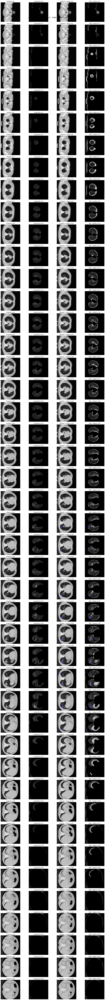

In [8]:
# ============================================================
# CELL 3 — HIỂN THỊ TOÀN BỘ LÁT CẮT CHO 1 CT COVID NGẪU NHIÊN
# ============================================================
import matplotlib.pyplot as plt
import numpy as np
import random

# 1) Chọn ngẫu nhiên 1 case COVID
covid_cases = list_covid_cases()
covid_case = random.choice(covid_cases)

print("=== CASE COVID NGẪU NHIÊN ===")
print(covid_case)

ct_nii  = nib.load(covid_case["ct_path"])
lbl_nii = nib.load(covid_case["label_path"])

ct  = ct_nii.get_fdata().astype(np.float32)
lbl = lbl_nii.get_fdata().astype(np.float32)

print("CT shape :", ct.shape)
print("LBL shape:", lbl.shape)

# 2) Segment phổi (placeholder hoặc lungmask)
lung_mask = segment_lung_3d(ct)
ct_lung   = np.where(lung_mask, ct, -1024.0)

# 3) Tạo lesion mask nhị phân và ROI
lesion_mask_bin = make_lesion_mask(lbl)
roi_mask, ct_roi = make_roi_covid(ct, lung_mask, lesion_mask_bin, dilate_iter=2)

print("Lesion unique:", np.unique(lesion_mask_bin))

# 4) Hiển thị toàn bộ lát cắt
H, W, Z = ct.shape
z_list = list(range(Z))   # HIỂN THỊ TOÀN BỘ SLICE

print("Tổng số lát cắt:", Z)
print("Danh sách slice hiển thị:", z_list)

# scale cho hình ảnh
vmin = np.percentile(ct, 1)
vmax = np.percentile(ct, 99)

rows = Z
cols = 4
fig, axes = plt.subplots(rows, cols, figsize=(16, 3 * rows))

# Nếu chỉ có 1 slice
if rows == 1:
    axes = np.expand_dims(axes, axis=0)

for row, z in enumerate(z_list):
    ct_slice      = ct[:, :, z]
    ct_lung_slice = ct_lung[:, :, z]
    ct_roi_slice  = ct_roi[:, :, z]
    lesion_slice  = lesion_mask_bin[:, :, z]

    # 1) Original
    ax = axes[row, 0]
    ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(f"Original z={z}")
    ax.axis('off')

    # 2) Lung-only
    ax = axes[row, 1]
    ax.imshow(ct_lung_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(f"Lung-only z={z}")
    ax.axis('off')

    # 3) Original + lesion overlay
    ax = axes[row, 2]
    ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.imshow(
        np.ma.masked_where(lesion_slice == 0, lesion_slice),
        cmap='jet', alpha=0.45
    )
    ax.set_title(f"Original + lesion z={z}")
    ax.axis('off')

    # 4) ROI + lesion overlay
    ax = axes[row, 3]
    ax.imshow(ct_roi_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.imshow(
        np.ma.masked_where(lesion_slice == 0, lesion_slice),
        cmap='jet', alpha=0.45
    )
    ax.set_title(f"ROI + lesion z={z}")
    ax.axis('off')

plt.suptitle(
    f"COVID case {covid_case['case_id']} ({covid_case['part']}) - Hiển thị toàn bộ {Z} lát cắt",
    fontsize=18
)
plt.tight_layout()
plt.show()

### 7.4 Hiển thị 7 lát giữa cho 1 CT NORMAL ngẫu nhiên

=== CASE NORMAL NGẪU NHIÊN ===
{'case_id': '26', 'ct_path': 'D:\\Code\\PythonProject\\Advanced\\multi_task_ct\\data\\raw\\covid19_normal\\Organized Normal CT Data\\26_ns002i00001.hdr'}
CT NORMAL shape: (512, 512, 50)
Các slice hiển thị (NORMAL): [22, 23, 24, 25, 26, 27, 28]


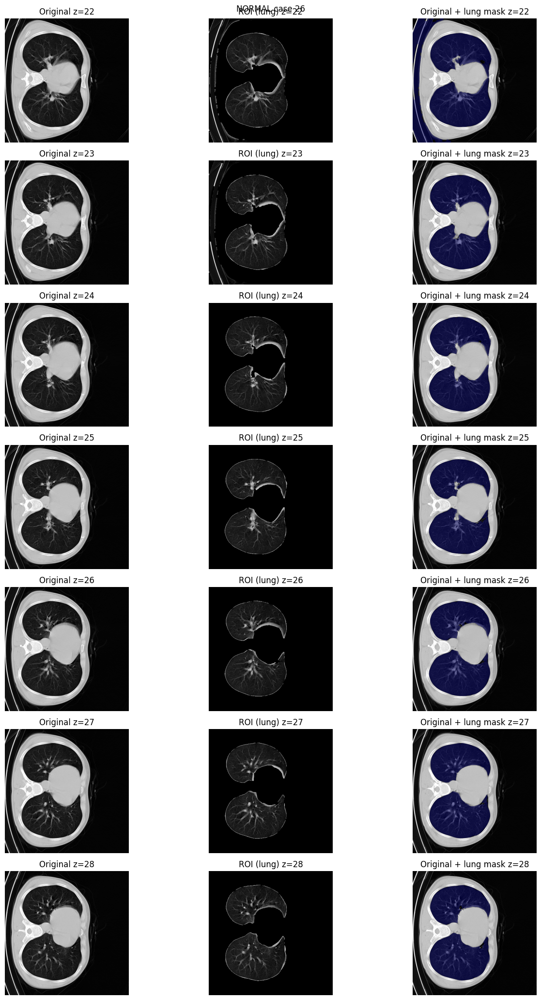

In [45]:
# ============================================================
# CELL 4 — HIỂN THỊ 7 LÁT GIỮA CHO 1 CT NORMAL NGẪU NHIÊN
#           3 CỘT: ORIGINAL / ROI(LUNG) / ORIGINAL + LUNG MASK
# ============================================================
import matplotlib.pyplot as plt
import numpy as np

# 1) Chọn ngẫu nhiên 1 case NORMAL
normal_cases = list_normal_cases()
normal_case = random.choice(normal_cases)

print("=== CASE NORMAL NGẪU NHIÊN ===")
print(normal_case)

ctN_nii = nib.load(normal_case["ct_path"])
ctN = ctN_nii.get_fdata().astype(np.float32)
print("CT NORMAL shape:", ctN.shape)

# 2) Segment phổi
lung_mask_N = segment_lung_3d(ctN)  # 0/1, cùng shape với ctN
roi_mask_N, ctN_roi = make_roi_normal(ctN, lung_mask_N, dilate_iter=1)

# 3) Chọn 7 lát giữa
H, W, ZN = ctN.shape
z_mid = ZN // 2
half = 3
z_list_N = [z for z in range(z_mid - half, z_mid + half + 1) if 0 <= z < ZN]
print("Các slice hiển thị (NORMAL):", z_list_N)

vminN = np.percentile(ctN, 1)
vmaxN = np.percentile(ctN, 99)

rows = len(z_list_N)
fig, axes = plt.subplots(rows, 3, figsize=(14, 3 * rows))
if rows == 1:
    axes = np.expand_dims(axes, axis=0)

for row, z in enumerate(z_list_N):
    ct_slice      = ctN[:, :, z]
    roi_slice     = ctN_roi[:, :, z]
    lung_slice    = lung_mask_N[:, :, z].astype(np.uint8)

    # 1) Original
    ax = axes[row, 0]
    ax.imshow(ct_slice, cmap='gray', vmin=vminN, vmax=vmaxN)
    ax.set_title(f"Original z={z}")
    ax.axis('off')

    # 2) ROI (lung-only)
    ax = axes[row, 1]
    ax.imshow(roi_slice, cmap='gray', vmin=vminN, vmax=vmaxN)
    ax.set_title(f"ROI (lung) z={z}")
    ax.axis('off')

    # 3) Original + lung mask overlay
    ax = axes[row, 2]
    ax.imshow(ct_slice, cmap='gray', vmin=vminN, vmax=vmaxN)
    ax.imshow(
        np.ma.masked_where(lung_slice == 0, lung_slice),
        cmap='jet', alpha=0.4
    )
    ax.set_title(f"Original + lung mask z={z}")
    ax.axis('off')

plt.suptitle(f"NORMAL case {normal_case['case_id']}", fontsize=12)
plt.tight_layout()
plt.show()

# 

## 8.

In [92]:
!pip install lungmask SimpleITK


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [97]:
import os
import numpy as np
import nibabel as nib
import SimpleITK as sitk
import matplotlib.pyplot as plt

from lungmask.mask import LMInferer  # dùng class bạn vừa show

# ĐƯỜNG DẪN VÍ DỤ: 1 CT bất kỳ trong Part 1
RAW_ROOT = r"D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal"
COVID_ROOT = os.path.join(RAW_ROOT, "Organized COVID19 CT Data_rev2")
PART1_CT_DIR = os.path.join(COVID_ROOT, "Part 1")

# chọn ngẫu nhiên 1 file .hdr
ct_files = [f for f in os.listdir(PART1_CT_DIR) if f.lower().endswith(".hdr")]
print("Số CT trong Part 1:", len(ct_files))

import random
ct_name = random.choice(ct_files)
ct_path = os.path.join(PART1_CT_DIR, ct_name)
print("Chọn CT:", ct_path)

# đọc CT bằng nibabel (HU)
ct_nii = nib.load(ct_path)
ct_hu = ct_nii.get_fdata().astype(np.float32)   # (H,W,Z)
print("CT shape:", ct_hu.shape, "HU range:", ct_hu.min(), "→", ct_hu.max())

Số CT trong Part 1: 148
Chọn CT: D:\Code\PythonProject\Advanced\multi_task_ct\data\raw\covid19_normal\Organized COVID19 CT Data_rev2\Part 1\p5_ns002i00001.hdr
CT shape: (512, 512, 43) HU range: -1024.0 → 2802.0


In [98]:
# Chuyển sang SimpleITK Image (lungmask dùng SimpleITK/NumPy đều được)
# lungmask.accepts np.ndarray dạng (Z,H,W) hoặc sitk.Image.
# Ở trên ct_hu là (H,W,Z) nên ta transpose lại:
ct_for_lungmask = np.transpose(ct_hu, (2, 0, 1))   # (Z,H,W)

# Tạo inferer – CHỈ TÁCH PHỔI
#  - 'R231'      : model chung
#  - 'R231CovidWeb' : model fine-tune cho COVID CT
inferer = LMInferer(
    modelname="R231CovidWeb",  # hoặc "R231"
    force_cpu=False,           # nếu có GPU thì nó dùng, không thì CPU
    batch_size=16,
    volume_postprocessing=True,
    tqdm_disable=False,
)

print("Đang chạy segmentation phổi bằng lungmask...")
seg_lung = inferer.apply(ct_for_lungmask)  # (Z,H,W), giá trị 0/1/2
print("seg_lung shape:", seg_lung.shape, "unique:", np.unique(seg_lung))

# Gộp phổi trái + phải thành 1 mask nhị phân (0/1)
lung_mask_3d = (seg_lung > 0).astype(np.uint8)   # (Z,H,W)

# Đưa về (H,W,Z) cho giống ct_hu
lung_mask_3d = np.transpose(lung_mask_3d, (1, 2, 0))  # (H,W,Z)
print("lung_mask_3d shape:", lung_mask_3d.shape, "unique:", np.unique(lung_mask_3d))

Downloading: "https://github.com/JoHof/lungmask/releases/download/v0.0/unet_r231covid-0de78a7e.pth" to D:\Environment\Python\python3.10\torch_cache\hub\checkpoints\unet_r231covid-0de78a7e.pth
100%|██████████| 119M/119M [00:11<00:00, 11.1MB/s] 


Đang chạy segmentation phổi bằng lungmask...


 74%|███████▍  | 2/2.6875 [00:01<00:00,  1.52it/s]d:\Environment\Python\python3.10\lib\site-packages\tqdm\std.py:636: TqdmWarning: clamping frac to range [0, 1]
  full_bar = Bar(frac,
112%|██████████| 3/2.6875 [00:01<00:00,  1.68it/s]

lungmask 2025-11-28 15:07:25 Postprocessing



100%|██████████| 53/53 [00:00<00:00, 170.34it/s]


seg_lung shape: (43, 512, 512) unique: [0 1 2]
lung_mask_3d shape: (512, 512, 43) unique: [0 1]


Các slice hiển thị: [0, 1, 2, 20, 21, 22, 40, 41, 42]


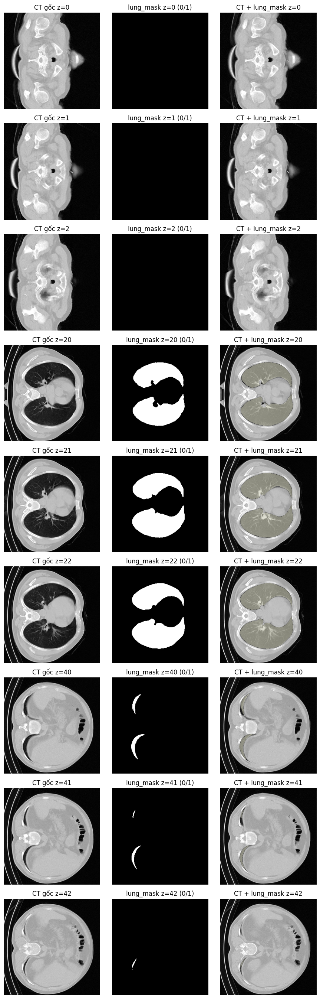

In [99]:
H, W, Z = ct_hu.shape
idxs = [0, 1, 2, Z//2 - 1, Z//2, Z//2 + 1, Z-3, Z-2, Z-1]
idxs = sorted(set([i for i in idxs if 0 <= i < Z]))  # tránh trùng lặp / vượt biên
print("Các slice hiển thị:", idxs)

vmin = np.percentile(ct_hu, 1)
vmax = np.percentile(ct_hu, 99)

fig, axes = plt.subplots(len(idxs), 3, figsize=(9, 3*len(idxs)))
if len(idxs) == 1:
    axes = np.expand_dims(axes, axis=0)

for row, z in enumerate(idxs):
    ct_slice = ct_hu[:, :, z]
    lung_slice = lung_mask_3d[:, :, z]

    # 1) CT gốc
    ax = axes[row, 0]
    ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(f"CT gốc z={z}")
    ax.axis('off')

    # 2) Lung mask nhị phân
    ax = axes[row, 1]
    ax.imshow(lung_slice, cmap='gray', vmin=0, vmax=1)
    ax.set_title(f"lung_mask z={z} (0/1)")
    ax.axis('off')

    # 3) Overlay CT + lung mask
    ax = axes[row, 2]
    ax.imshow(ct_slice, cmap='gray', vmin=vmin, vmax=vmax)
    ax.imshow(
        np.ma.masked_where(lung_slice == 0, lung_slice),
        cmap='YlGn', alpha=0.5,
    )
    ax.set_title(f"CT + lung_mask z={z}")
    ax.axis('off')

plt.tight_layout()
plt.show()